In [1]:
# Implementation of core Gradient Descent optimization algorithm

# importing necessary libraries

import jax
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
import numdifftools as nd
plt.rcParams["figure.dpi"] = 1200
plt.rcParams["figure.autolayout"] = True

import random
np.random.seed(69)
random.seed(69)


2023-02-03 13:50:11.128400: W external/org_tensorflow/tensorflow/tsl/platform/default/dso_loader.cc:66] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/m3rg2000/anaconda3/envs/ap/lib/
2023-02-03 13:50:11.344228: W external/org_tensorflow/tensorflow/tsl/platform/default/dso_loader.cc:66] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/m3rg2000/anaconda3/envs/ap/lib/
2023-02-03 13:50:11.347878: W external/org_tensorflow/tensorflow/tsl/platform/default/dso_loader.cc:66] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/m3rg2000/anaconda3/envs/ap/lib/


# Truss

In [2]:
# defining the geometery of truss

E = 1e7 #68947572.93178 # KN/m^2 (10e7 psi) modulus_of_elasticity
p = 0.1  #27.1447138 # KN/m^3 (0.1 lb/in^3) weight_density
s_lim = 25000.0 #172368.93233 #KN/m^2 (25000 psi) # allowable_stress_compression = 172368.93233 #KN/m^2 (25000 psi)
d_lim =  2.0 #0.0508 #m (2 inch) #displacemnt limit

In [3]:
area_avalival = [1.62, 1.80,2.38, 2.62, 2.88, 3.09, 3.13,
3.38,3.63,3.84,3.87,4.18,4.49,4.80,4.97,5.12, 5.74, 7.22,
7.97,11.5,13.5,13.9,14.2,15.5,16.0,18.8,19.9,22.0,22.9,
26.5, 30.0, 33.5]  ## sq inch

In [115]:
nodes, bars =[], []

nodes.append([100,460]) #node0
nodes.append([460,460]) #node1
nodes.append([820,460]) #node2
nodes.append([100,100]) #node3
nodes.append([460,100]) #node4
nodes.append([820,100]) #node5

bars.append([0,1]) #bar1  #dont forget python starts with 0
bars.append([1,2]) #bar2

bars.append([3,4]) #bar3
bars.append([4,5]) #bar4


bars.append([1,4]) #bar5
bars.append([2,5]) #bar6

bars.append([0,4]) #bar7
bars.append([1,3]) #bar8

bars.append([1,5]) #bar9
bars.append([2,4]) #bar10

nodes = np.array(nodes).astype(float)
bars = np.array(bars)
original_nodes = np.copy(nodes)

In [5]:
# bars, nodes

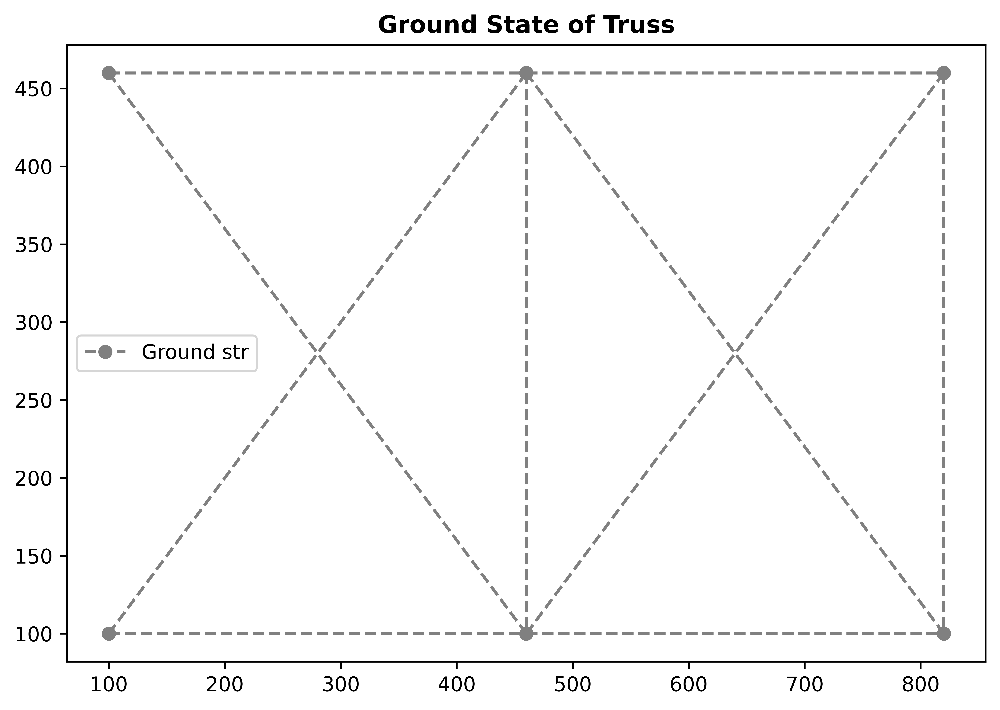

In [6]:
plt.figure(figsize=(7,5))
plt.title("Ground State of Truss", fontweight='bold')
for i in range(len(bars)):
    xi, xf = nodes[bars[i,0],0], nodes[bars[i, 1],0]
    yi, yf = nodes[bars[i, 0], 1], nodes[bars [i, 1],1]
    line, = plt.plot([xi, xf], [yi, yf], color='grey', linestyle='--', marker='o') 

line.set_label('Ground str')
plt.legend()
plt.show()

In [7]:
P = np.zeros_like(nodes) # 0 =nO LOAD # 1 == lOAD
P[4,1]= -100000
P[5,1]= -100000
print(P)

[[      0.       0.]
 [      0.       0.]
 [      0.       0.]
 [      0.       0.]
 [      0. -100000.]
 [      0. -100000.]]


In [8]:
Ur = [0,0,0,0]

In [9]:
# Defining the degrees of Freedoms
DOFCON = np.ones_like(nodes).astype(int)
DOFCON[0,:] = 0
DOFCON[3,:] = 0
print(DOFCON)

[[0 0]
 [1 1]
 [1 1]
 [0 0]
 [1 1]
 [1 1]]


## Truss Analysis

In [10]:
# Truss Analysis
# Doing structural analysis of the truss for an constant area of 11.5 inch^2

In [58]:
original_area, original_nodes, original_bars = np.array([32.]*10), nodes.copy(), bars.copy()

In [12]:
@jax.jit
class basic(): 

    def min_area(area):
        computed_area =[]
        for i in area:
            if i<1:
                computed_area.append(1)
            else:
                computed_area.append(i)
        return np.array(computed_area)

    def area_gen(area):
        area_new = []
        for i in range(10):
            area_new.append(random.choice(area))
        return area_new

    def scaler(area):
        f=[]
        a = sum(area)
        for i in area:
            i=i*50
            f.append(i/a)
        return f

    def Plot(nodes, c, lt, area, lg):
        for i in range(len(bars)):
            xi, xf = nodes[bars[i,0],0], nodes[bars[i,1],0]
            yi, yf = nodes[bars[i,0],1], nodes[bars[i,1],1]
            a = np.round(basic.scaler(area), 3)
            line, = plt.plot([xi, xf], [yi,yf], color=c, linestyle=lt, linewidth=a[i],
                             label=f'\nArea : {area[i]} in^2\n', marker='o', solid_capstyle='round') #
        line, = plt.plot([xi, xf], [yi,yf], color=c, linestyle=lt, linewidth=0.001, solid_capstyle='round')
        line.set_label(lg)
        plt.legend(bbox_to_anchor=(1,1), loc="upper left", prop={'size':4})
    

    def check( STRESS, DEFLECTION):
        x=0
        y=0
        for i in STRESS:
            if (np.abs(i) > s_lim).all():
                x +=1
                # print("Failed in Stress")
            else:
                pass
                #print("Pass in Stress")
        for i in range(6):
            ix = np.abs(DEFLECTION[i][0])
            iy = np.abs(DEFLECTION[i][1])
            if (ix > d_lim).all():
                y+=1
                #print("Failed in Deflection along X")
            elif (iy > d_lim).all():
                y +=1
                #print("Failed in Deflection along Y")
            else:
                pass
                #print("Pass in Deflection")
        if (x ==0) and (y==0):
            # print("Pass")
            return "Pass"
        else:
            # print(f'Failed in {x} ways for stress \n Failed in {y} ways for deflection ')
            return f'Failed in {x} ways for stress \n Failed in {y} ways for deflection '

@jax.jit
class Truss():
    # Truss Structural Analysis
    def TrussAnalysis(A, nodes, bars):
        NN = len(nodes) # number of nodes
        NE = len(bars) # number of deges
        # print(NE)

        DOF = 2 # defree of freedom
        NDOF = DOF*NN # total degree of freedom

        #structural analysis using direct stifness method

        # for bar no 3
        # takes info from node no 3 and substract it from infor of node no 2
        d = nodes[bars[:,1],:] - nodes[bars[:,0],:]
        
        L = np.sqrt((d**2).sum(axis=1)) #leangth of the bar
        # print(f"The Leangth is {L}")
        #computing the angle 
        angle = d.T/L
        # print(f"The angle is \n\n{angle}\n\n")
        #transformation vector {a ==Transformation vector}
        a = np.concatenate((-angle.T, angle.T), axis=1)
        # print(f"The transformation vector is \n\n{a}\n\n")

        #Global stifness matrix K
        K = np.zeros([NDOF,NDOF])
        
        
        for k in range(NE):
            aux = 2*bars[k,:]
            #gives you degree of freedom in each node
            index = np.r_[aux[0]:aux[0]+2, aux[1]:aux[1]+2]
            # print(f'a : {a.shape}, A: {A.shape}, L: {L.shape}')
            ES = np.dot(a[k][np.newaxis].T*E*A[k], a[k][np.newaxis])/L[k]
            # print(f"Stifness Matrix \n\n{ES}\n\n")
            K[np.ix_(index,index)] = K[np.ix_(index,index)] + ES

        freeDOF = DOFCON.flatten().nonzero()[0]
        supportDOF = (DOFCON.flatten()==0).nonzero()[0]

        Kff = K[np.ix_(freeDOF, freeDOF)]
        Kfr = K[np.ix_(freeDOF, supportDOF)]
        Krf = Kfr.T
        # print(f'{Kfr}, \n \n {Kff}, \n \n {Krf}')
        Krr = K[np.ix_(supportDOF, supportDOF)]
        
        Pf = P.flatten()[freeDOF]
        #Uf = np.linalg.solve(Kff, Pf) #.lstsq
        Uf = np.linalg.inv(Kff)@ Pf
        U  = DOFCON.astype(float).flatten()
        U[freeDOF] = Uf
        U[supportDOF] = Ur

        U = U.reshape(NN, DOF) #displacement of the truss members
        u = np.concatenate((U[bars[:,0]], U[bars[:,1]]), axis=1)
        # print(E)
        # print(A)
        N = E*A[:]/L[:]*(a[:]*u[:]).sum(axis=1)
        R = (Krf[:]*Uf).sum(axis=1) + (Krr[:]*Ur).sum(axis=1) #Reaction Force
        R = R.reshape(2,DOF)

        # Stress
        S = N/A

        #weight of str
        Volume = (1*A*L).sum() #for mass replace 1 by p==0.1

        #check
        c = basic.check(S, U)

        return S, Volume, U, c, R 

basic = jax.jit(basic)
Truss = jax.jit(Truss)

In [13]:
x = np.array([20 for i in range(10)]).astype(float)
x

array([20., 20., 20., 20., 20., 20., 20., 20., 20., 20.])

In [14]:
Truss.TrussAnalysis(x, nodes, bars)

(array([  9768.24934844,   2006.23161277, -10231.75065156,  -2993.76838723,
          1774.48096122,   2006.23161277,   7398.81272639,  -6743.32289734,
          4233.82785582,  -2837.23995605]),
 83929.35059634515,
 array([[ 0.        ,  0.        ],
        [ 0.35165698, -0.83717623],
        [ 0.42388131, -1.89756315],
        [ 0.        ,  0.        ],
        [-0.36834302, -0.90105754],
        [-0.47611869, -1.96978749]]),
 'Pass',
 array([[-300000.        ,  104635.01303119],
        [ 300000.        ,   95364.98696881]]))

## Determinacy and mechanism formation

In [15]:
@jax.jit 
class opr():

    def calculate_degree_of_freedom(nodes, bars):
        """Calculates the degree of freedom of the truss."""
        dof = 2 * len(nodes)
        for bar in bars:
            node1, node2 = nodes[bar[0]], nodes[bar[1]]
            if node1[0] == node2[0]:
                dof -= 1
            if node1[1] == node2[1]:
                dof -= 1
        return dof

    def calculate_number_of_equations(nodes, bars):
        """Calculates the number of equations of the truss."""
        eq = len(nodes) * 2 - opr.calculate_degree_of_freedom(nodes, bars)
        return eq

    def kinematic_determinacy(nodes, bars):
        """Checks the kinematic determinacy of the truss."""
        dof = opr.calculate_degree_of_freedom(nodes, bars)
        eq = opr.calculate_number_of_equations(nodes, bars)
        if dof == eq:
            return "Kinematically Determinate"
        else:
            return "Kinematically Indeterminate"

    def static_determinacy(nodes, bars):
        """Checks the static determinacy of the truss."""
        dof = opr.calculate_degree_of_freedom(nodes, bars)
        eq = opr.calculate_number_of_equations(nodes, bars)
        if eq >= dof:
            return "Statically Determinate"
        else:
            return "Statically Indeterminate"


    def is_mechanism(nodes, bars):
        """Checks if the truss is a mechanism or not."""
        dof = opr.calculate_degree_of_freedom(nodes, bars)
        eq = opr.calculate_number_of_equations(nodes, bars)
        if dof > eq:
            return True
        else:
            return False

In [16]:
opr.is_mechanism(nodes, bars)

False

# Gradient Descent

## Area optimization

In [17]:
def f_area(x):
    return Truss.TrussAnalysis(x, nodes, bars)[1]

grad = nd.Gradient(f_area)(np.array([10]*10))
grad

array([360.        , 360.        , 360.        , 360.        ,
       360.        , 360.        , 509.11688245, 509.11688245,
       509.11688245, 509.11688245])

In [18]:

# x = np.random.uniform(50, 100, 10) # np.array([100. for i in range(10)]).astype(float)

def cost(x):
    ans = Truss.TrussAnalysis(x, nodes, bars)
    return ans

# def gradient(x, var): # truss_volume_derivative
#     """Function that calculates the derivative of the truss volume with respect to the variable var"""
#     h = 1e-8 # Step size
#     var_index = var - 1 # Index of the variable in the x array
    
#     x_plus_h = np.array(x)
#     x_plus_h[var_index] += h
#     x_minus_h = np.array(x)
#     x_minus_h[var_index] -= h

#     return (cost(x_plus_h)[1] - cost(x_minus_h)[1]) / (2 * h)
# def gradient(x): # truss_volume_derivative
#     """Function that calculates the derivative of the truss volume with respect to the variable var"""
#     h = 1e-8 # Step size
#     gg = []
#     for i in range(len(x)):
        
#         var_index = i # Index of the variable in the x array
        
#         x_plus_h = np.array(x)#[cost(x)[1]]*10
#         x_plus_h[var_index] += h
#         x_minus_h = np.array(x)#[cost(x)[1]]*10
#         x_minus_h[var_index] -= h

#         gg.append((cost(x_plus_h)[1] - cost(x_minus_h)[1]) / (2 * h))

#     return np.array(gg)
    
def comp(x):
    temp = 0
    for i in x:
        if i < 0:
            temp += 1
        else:
            pass
    return temp

# To be used if we want to clip the gradient by certain factor or reduce it.
# def clip(grad):
#     gg = []
#     for i in grad:
#         # if i <= 200:
#         #     gg.append(i)
#         # else:
#         #     gg.append(200)
#         gg.append(i*1e-2)
#     return np.array(gg)

def optimize(initial_area):
    # x = np.array([100. for i in range(10)]).astype(float) #basic.area_gen([100.0]) # initial x value
    x = initial_area
    learning_rate = 0.001
    max_steps = 10000
    x_new = x

    v = []
    for step in range(max_steps):
     
        if (comp(x) == 0) and (cost(x)[3]=="Pass"):
            x_prev = x.copy()

            # Compute the gradient
            grad = nd.Gradient(f_area)(x)
            # grad = clip(grad)
            # print(grad)
            # Update x using gradient descent
            
            x_new -= grad * np.array([learning_rate]*len(x))
            # print(f"x_new : {x}")
            # Compute the current vol
            cost_value = cost(x)[1]
            
            x = x_new
            v.append(cost_value)
            # Print progress
            # if step % 100 == 0:
            #     print("Step: {} Area: {} Volume: {}\n".format(step, x_prev, cost_value))
            # else:
            #     pass

            # print("Step: {} Area: {} Volume: {}\n".format(step, x_prev, cost_value))
        else:
            return x_prev, v


In [19]:
area = np.array([25.]*10)

In [20]:
gd = optimize(area)

In [21]:
Truss.TrussAnalysis(gd[0], nodes, bars)

(array([ 9457.49478343,  1964.34238211, -9884.86498446, -2871.24755986,
         1750.65728159,  1964.34238211,  7817.15759975, -7155.51405947,
         4445.1915363 , -3041.14429331]),
 83138.88824543203,
 array([[ 0.        ,  0.        ],
        [ 0.34046981, -0.85566682],
        [ 0.41118614, -1.90469415],
        [ 0.        ,  0.        ],
        [-0.35585514, -0.91869049],
        [-0.45922005, -1.97541048]]),
 'Pass',
 array([[-300000.        ,  104419.00787874],
        [ 300000.        ,   95580.99212126]]))

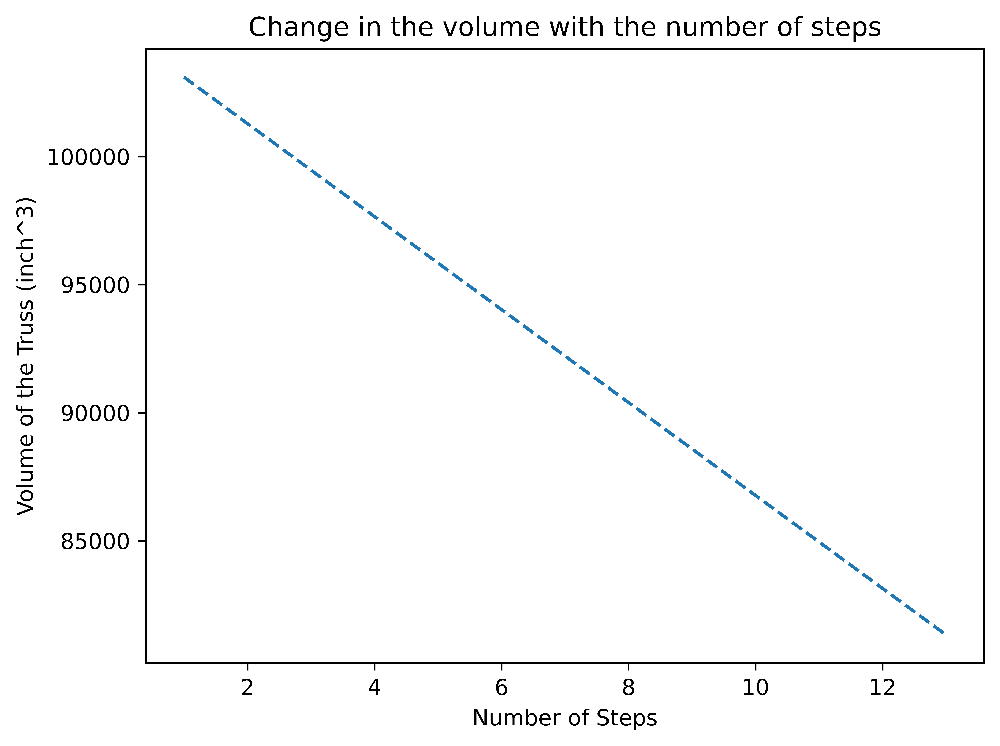

In [22]:
plt.plot(np.linspace(1, len(gd[1]), len(gd[1])), gd[1], "--")
plt.title("Change in the volume with the number of steps")
plt.xlabel("Number of Steps")
plt.ylabel("Volume of the Truss (inch^3)")
plt.tight_layout()
plt.show()

In [23]:
soln = Truss.TrussAnalysis(gd[0], nodes, bars)
soln

(array([ 9457.49478343,  1964.34238211, -9884.86498446, -2871.24755986,
         1750.65728159,  1964.34238211,  7817.15759975, -7155.51405947,
         4445.1915363 , -3041.14429331]),
 83138.88824543203,
 array([[ 0.        ,  0.        ],
        [ 0.34046981, -0.85566682],
        [ 0.41118614, -1.90469415],
        [ 0.        ,  0.        ],
        [-0.35585514, -0.91869049],
        [-0.45922005, -1.97541048]]),
 'Pass',
 array([[-300000.        ,  104419.00787874],
        [ 300000.        ,   95580.99212126]]))

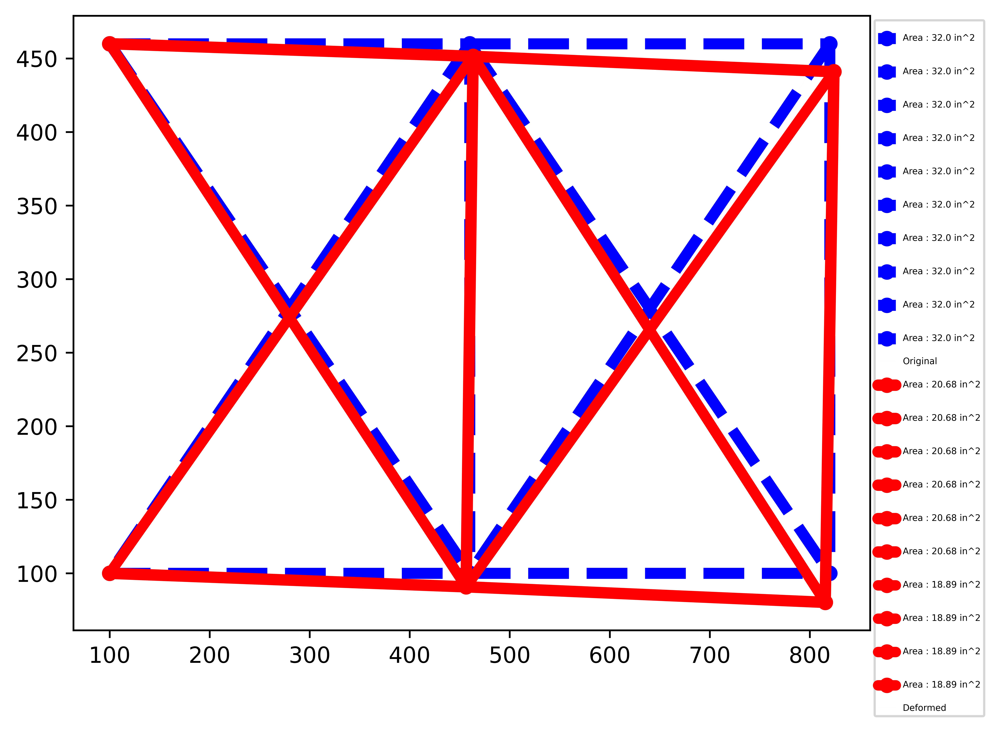

In [24]:
basic.Plot(nodes, 'b', '--',np.round(original_area,2), 'Original')
scale = 10
Dnodes=  soln[2]*scale + nodes
basic.Plot(Dnodes, 'r', '-',np.round(gd[0],2), 'Deformed')

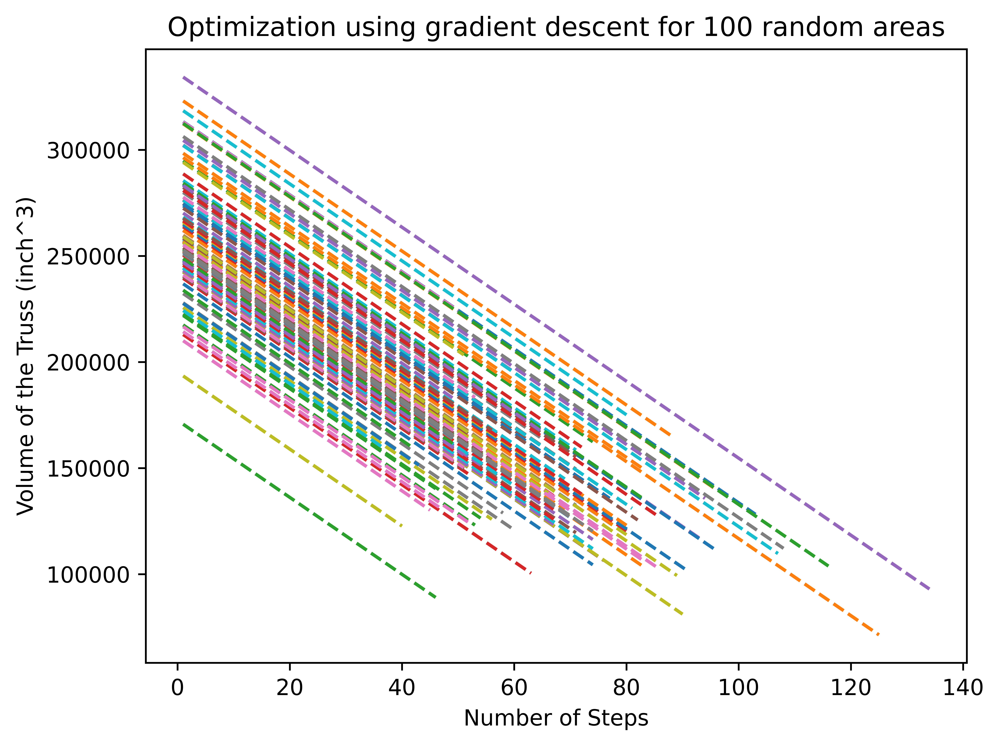

In [32]:
min_value = []
for i in range(100):
    area = np.random.uniform(25,100,10)
    gd = optimize(area)
    min_value.append(Truss.TrussAnalysis(gd[0], nodes, bars)[1])
    plt.plot(np.linspace(1, len(gd[1]), len(gd[1])), gd[1], "--")
    plt.title("Optimization using gradient descent for 100 random areas")
    plt.xlabel("Number of Steps")
    plt.ylabel("Volume of the Truss (inch^3)")
    plt.tight_layout()
plt.show()

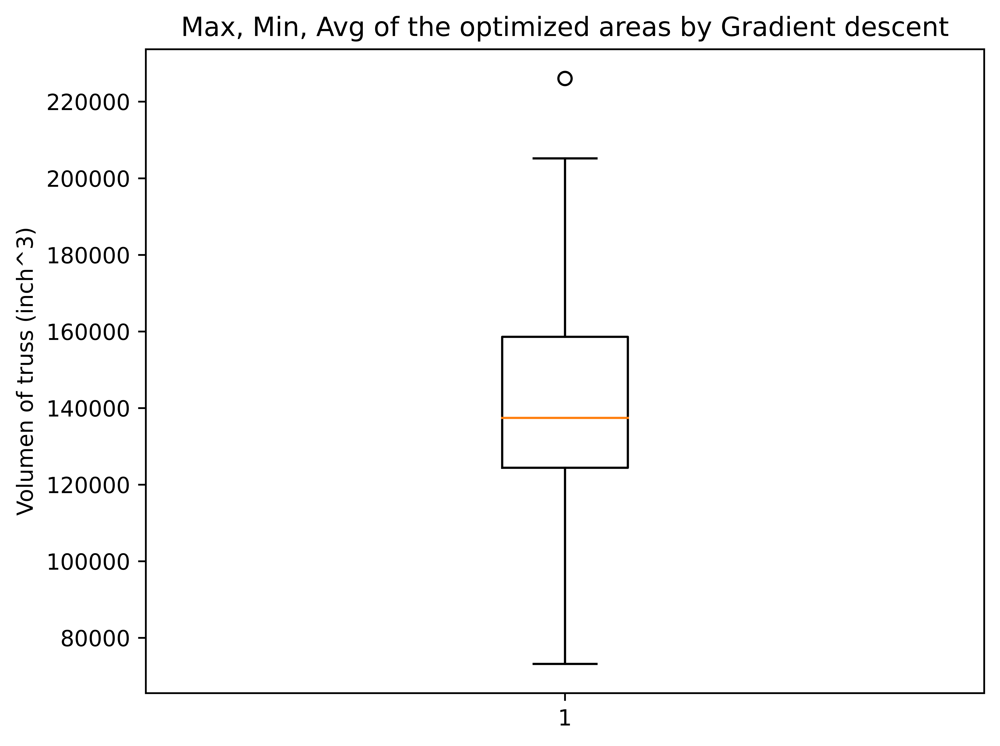

In [33]:
plt.boxplot(min_value)
plt.title("Max, Min, Avg of the optimized areas by Gradient descent")
plt.ylabel("Volumen of truss (inch^3)")
plt.tight_layout()
plt.show()

## Shape (nodal positions)

In [25]:
original_nodes = nodes.copy()

In [26]:
def f_shape(nodes):
    # num = np.array([x]*10)
    nodes = nodes.reshape(-1, 2)
    # print(nodes)
    return Truss.TrussAnalysis(x, nodes, bars)[1]

nd.Gradient(f_shape)(nodes).reshape(-1,2)

array([[-34.14213562,  14.14213562],
       [  0.        ,  48.28427125],
       [ 34.14213562,  34.14213562],
       [-34.14213562, -14.14213562],
       [  0.        , -48.28427125],
       [ 34.14213562, -34.14213562]])

In [27]:
area = np.array([30]*10)

In [29]:
def cost(nodes):
    ans = Truss.TrussAnalysis(x, nodes, bars)
    return ans
    
def lr(rate):
    item = []
    for idx in range(6):
        if (idx==1) or (idx==2):
            item.append([rate,rate])
        else:
            item.append([0,0])

    return np.array(item)

def optimize(nodes):
    x = nodes
    learning_rate = 0.001
    max_steps = 10000
    x_new = x 

    v = []
    for step in range(max_steps):
     
        if (cost(x)[3]=="Pass"):
            x_prev = x.copy()

            # Compute the gradient
            grad = nd.Gradient(f_shape)(x).reshape(-1,2)
            # grad = clip(grad)
            # print(grad)
            # Update x using gradient descent
           
            x_new -= grad * lr(learning_rate)
            # print(f"x_new : {x}")
            # Compute the current vol
            cost_value = cost(x)[1]
            
            x = x_new
            v.append(cost_value)
            # Print progress
            if step % 100 == 0:
                print("Step: {} Nodes: {} Volume: {}\n".format(step, x_prev, cost_value))
            else:
                pass

            # print("Step: {} Nodes: {} Volume: {}\n".format(step, x, cost_value))
        else:
            print("Optimization Saturated")
            return x_prev, v


In [30]:
node_opt = optimize(nodes)

Step: 0 Nodes: [[100. 460.]
 [460. 460.]
 [820. 460.]
 [100. 100.]
 [460. 100.]
 [820. 100.]] Volume: 83924.68800314047

Step: 100 Nodes: [[100.         460.        ]
 [460.00005348 455.19807802]
 [816.59521405 456.58196666]
 [100.         100.        ]
 [460.         100.        ]
 [820.         100.        ]] Volume: 83461.41944910584

Step: 200 Nodes: [[100.         460.        ]
 [460.00042677 450.4494802 ]
 [813.20962736 453.15650431]
 [100.         100.        ]
 [460.         100.        ]
 [820.         100.        ]] Volume: 83004.03830246208

Step: 300 Nodes: [[100.         460.        ]
 [460.0014293  445.7538589 ]
 [809.84347032 449.72405521]
 [100.         100.        ]
 [460.         100.        ]
 [820.         100.        ]] Volume: 82552.49243739828

Step: 400 Nodes: [[100.         460.        ]
 [460.00335716 441.11084916]
 [806.4969716  446.285073  ]
 [100.         100.        ]
 [460.         100.        ]
 [820.         100.        ]] Volume: 82106.72980269614

Ste

In [31]:
print(f" The new nodal positions after optimization are :\n {node_opt[0]}")

 The new nodal positions after optimization are :
 [[100.         460.        ]
 [460.07657912 407.24720031]
 [781.53859066 419.77750765]
 [100.         100.        ]
 [460.         100.        ]
 [820.         100.        ]]


In [35]:
print(f"Area: {x}")
Truss.TrussAnalysis(x, node_opt[0], bars)

Area: [20. 20. 20. 20. 20. 20. 20. 20. 20. 20.]


(array([ 10532.51383502,   2490.54896679, -10435.85470167,  -3624.58371048,
          2642.23619189,   2139.26907691,   6475.30354874,  -5999.88411456,
          4429.73911222,  -3149.5826171 ]),
 78882.55901275281,
 array([[ 0.        ,  0.        ],
        [ 0.27591705, -0.76089306],
        [ 0.39745606, -1.82186286],
        [ 0.        ,  0.        ],
        [-0.37569077, -0.84191262],
        [-0.50617578, -1.99994629]]),
 'Pass',
 array([[-300000.        ,  122109.85406651],
        [ 300000.        ,   77890.14593349]]))

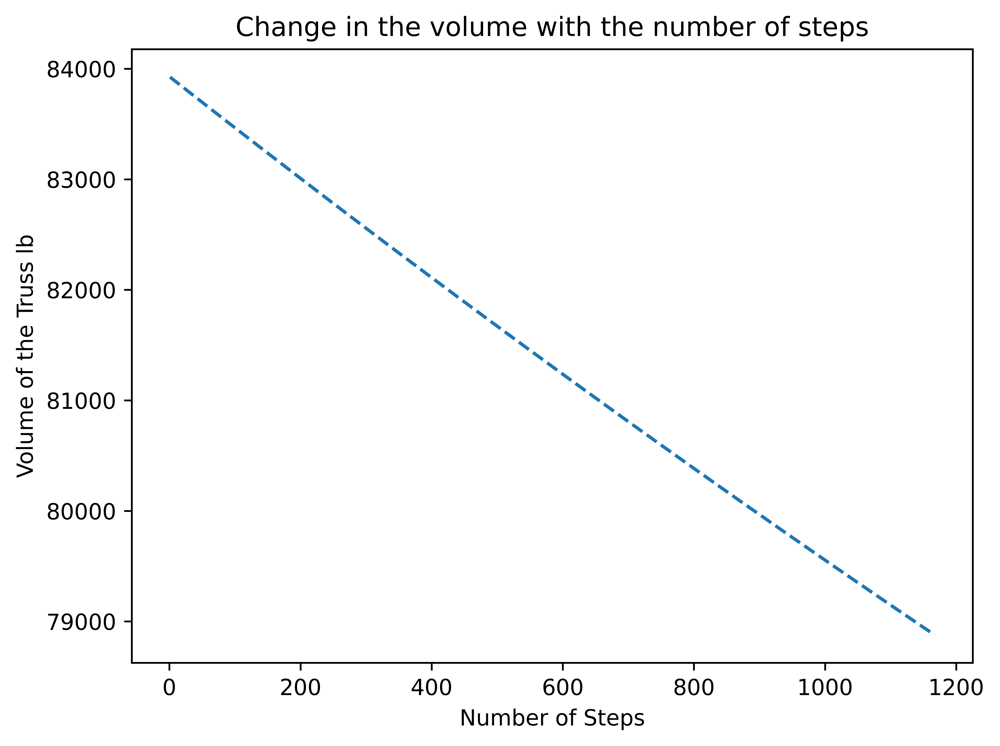

In [32]:
plt.plot(np.linspace(1, len(node_opt[1]), len(node_opt[1])), node_opt[1], "--")
plt.title("Change in the volume with the number of steps")
plt.xlabel("Number of Steps")
plt.ylabel("Volume of the Truss lb")
plt.tight_layout()
plt.show()

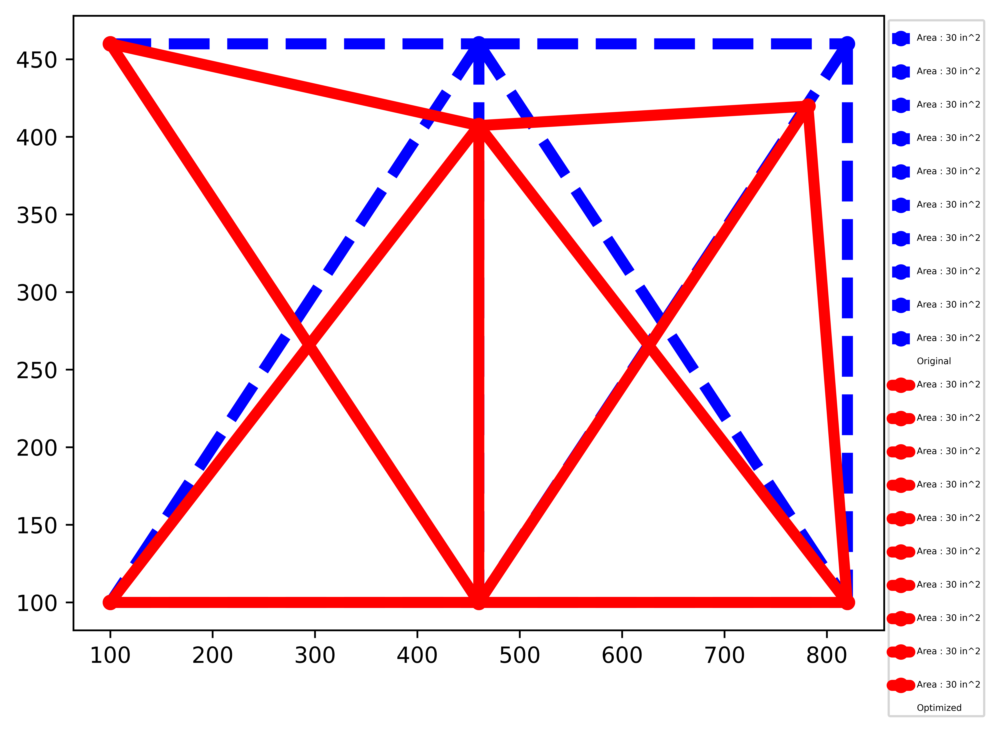

In [36]:
basic.Plot(original_nodes, 'b', '--', np.round(area,2), 'Original')
# scale = 10
# Dnodes=  soln[2]*scale + nodes
basic.Plot(node_opt[0], 'r', '-', np.round(area,2), 'Optimized')

## Combination of size and shape 

In [117]:
def cost(area, nodes, bars):
    ans = Truss.TrussAnalysis(area, nodes, bars)
    return ans
    
def lr(rate):
    item = []
    for idx in range(6):
        if (idx==1) or (idx==2):
            item.append([rate,rate])
        else:
            item.append([0,0])

    return np.array(item)

def optimize(area, nodes, bars):
    # x = nodes
    nodes_new = nodes
    area_new = area
    area_prev = area
    nodes_prev = nodes
    learning_rate = 0.001
    max_steps = 10000
    # x_new = x 

    v = []
    for step in range(max_steps):
     
        if (cost(area, nodes, bars)[3]=="Pass"):
            area_prev = area.copy()
            nodes_prev = nodes.copy()

            # Compute the gradient
            grad1 = nd.Gradient(f_shape)(nodes).reshape(-1,2)
            grad2 = nd.Gradient(f_area)(area)
            # grad = clip(grad)
            # print(grad)
            # Update x using gradient descent
           
            nodes_new -= grad1 * lr(0.1)
            area_new -= grad2 * np.array([0.001]*10)
            # print(f"x_new : {x}")
            # Compute the current vol
            cost_value = cost(area_new, nodes_new, bars)[1]
            
            nodes = nodes_new
            area = area_new
            v.append(cost_value)
            # Print progress
            # if step % 100 == 0:
            #     print("Step: {} Area: {} Nodes: {} Volume: {}\n".format(step, area_prev, nodes_prev, cost_value))
            # else:
            #     pass

            # print("Step: {} Nodes: {} Volume: {}\n".format(step, x, cost_value))
        else:
            print("Optimization Saturated")
            return area_prev, nodes_prev, v


In [113]:
original_area, original_nodes, original_bars = np.array([40.]*10), nodes.copy(), bars.copy()
original_area, original_nodes, original_bars

(array([40., 40., 40., 40., 40., 40., 40., 40., 40., 40.]),
 array([[100.        , 460.        ],
        [457.23067603, 180.67077235],
        [598.03132468, 195.66788678],
        [100.        , 100.        ],
        [460.        , 100.        ],
        [820.        , 100.        ]]),
 array([[0, 1],
        [1, 2],
        [3, 4],
        [4, 5],
        [1, 4],
        [2, 5],
        [0, 4],
        [1, 3],
        [1, 5],
        [2, 4]]))

In [99]:
zz = optimize(original_area, original_nodes, original_bars)

Step: 0 Area: [40. 40. 40. 40. 40. 40. 40. 40. 40. 40.] Nodes: [[100. 460.]
 [460. 460.]
 [820. 460.]
 [100. 100.]
 [460. 100.]
 [820. 100.]] Volume: 165124.8368688492

Optimization Saturated


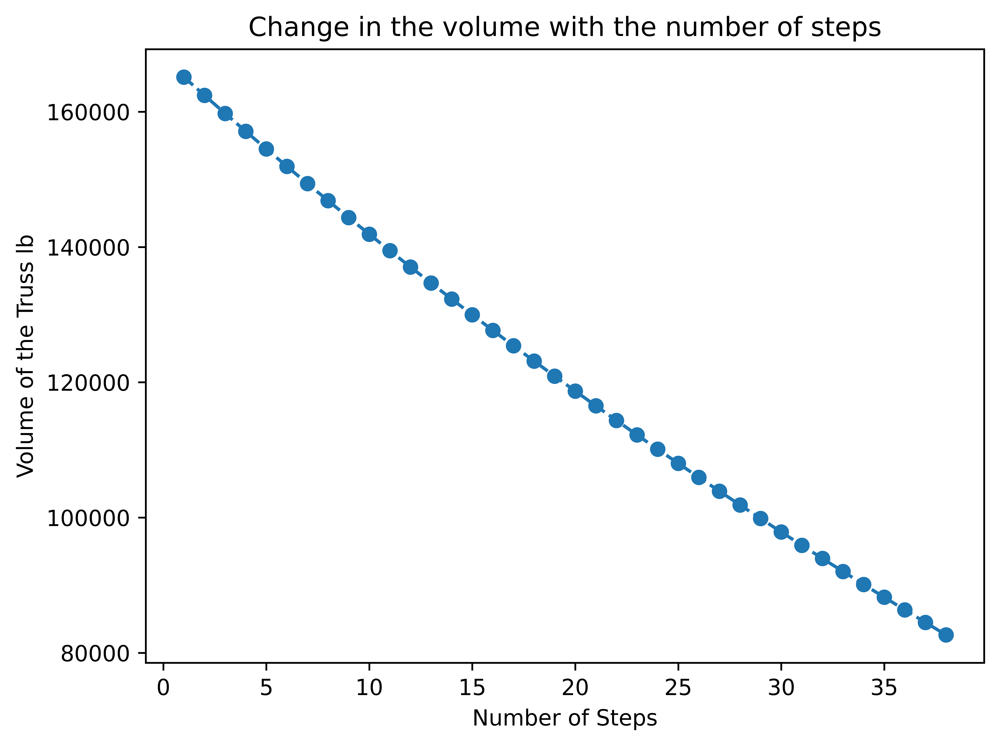

In [101]:
plt.plot(np.linspace(1, len(zz[2]), len(zz[2])), zz[2], "--o")
plt.title("Change in the volume with the number of steps")
plt.xlabel("Number of Steps")
plt.ylabel("Volume of the Truss lb")
plt.tight_layout()
plt.show()

In [107]:
def distort(nodes):
    item = []
    for idx in range(6):
        if (idx==1) or (idx==2):
            a = np.random.uniform(-20,20,1)[0]
            item.append([nodes[idx][0]+a,nodes[idx][1]+a])
        else:
            item.append([nodes[idx][0],nodes[idx][1]])
    return np.array(item)

distort(nodes)

array([[100.        , 460.        ],
       [444.19908335, 444.19908335],
       [802.33842917, 442.33842917],
       [100.        , 100.        ],
       [460.        , 100.        ],
       [820.        , 100.        ]])

Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimization Saturated
Optimizatio

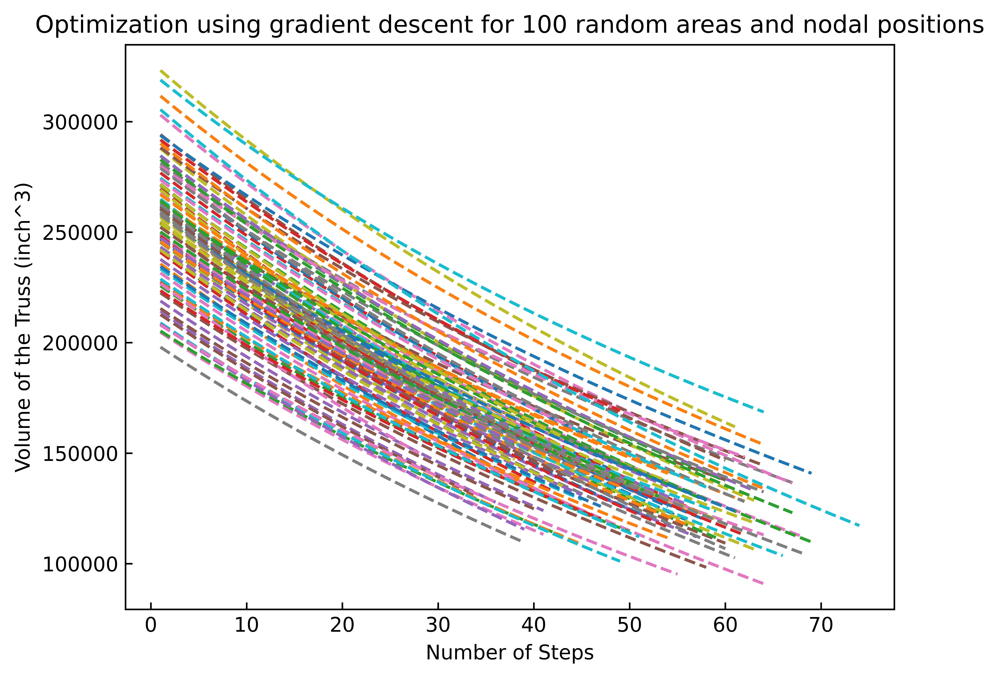

In [119]:
min_value = []
fig, ax = plt.subplots()
for i in range(100):
    area = np.random.uniform(25,100,10)
    n = distort(nodes)
    gd = optimize(area, n, bars)
    min_value.append(Truss.TrussAnalysis(gd[0], n, bars)[1])
    plt.plot(np.linspace(1, len(gd[2]), len(gd[2])), gd[2], "--")
ax.tick_params(axis='both', direction='in')
plt.title("Optimization using gradient descent for 100 random areas and nodal positions")
plt.xlabel("Number of Steps")
plt.ylabel("Volume of the Truss (inch^3)")
plt.tight_layout()
plt.show()

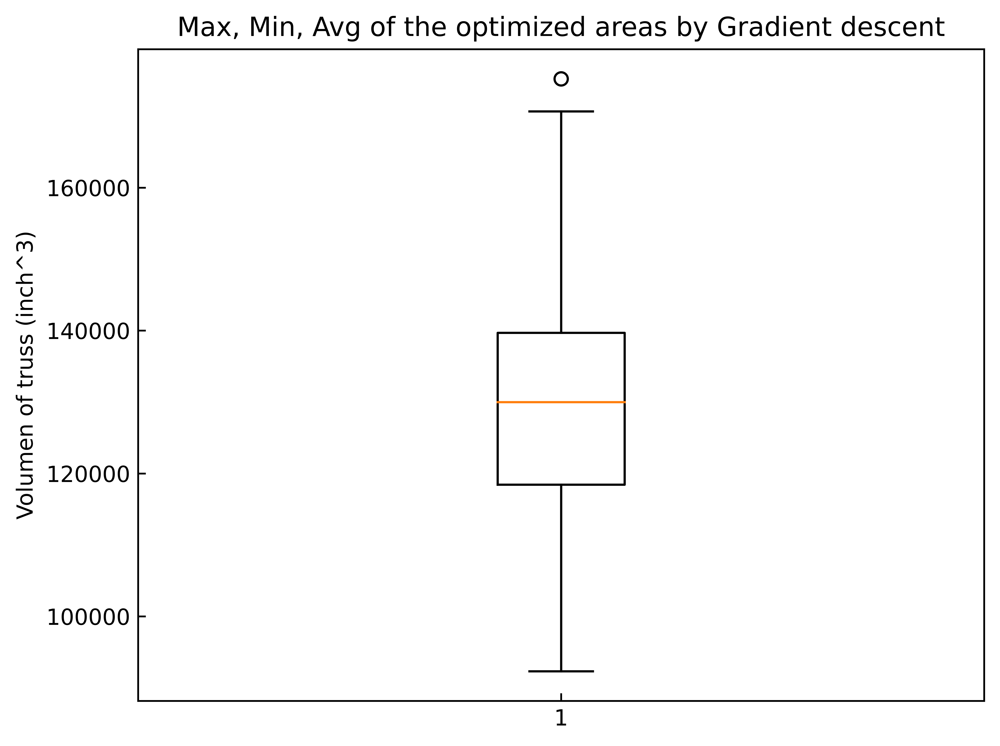

In [120]:
fig, ax = plt.subplots()
plt.boxplot(min_value)
ax.tick_params(axis='both', direction='in')
plt.title("Max, Min, Avg of the optimized areas by Gradient descent")
plt.ylabel("Volumen of truss (inch^3)")
plt.tight_layout()
plt.show()

In [92]:
zz[0],zz[1]

(array([23.        , 23.        , 23.        , 23.        , 23.        ,
        23.        , 19.27207794, 19.27207794, 19.27207794, 19.27207794]),
 array([[100.        , 460.        ],
        [460.6135616 , 354.49953609],
        [740.89413215, 373.45294428],
        [100.        , 100.        ],
        [460.        , 100.        ],
        [820.        , 100.        ]]))

In [93]:
Truss.TrussAnalysis(zz[0], zz[1], bars)

(array([10063.62416329,  2944.50824475, -9522.0909382 , -3808.08791839,
         3238.29934256,  2161.66029644,  5712.63742292, -5143.74059846,
         4690.39339999, -3892.58862738]),
 78423.62088856677,
 array([[ 0.        ,  0.        ],
        [ 0.19708009, -0.67299168],
        [ 0.34826809, -1.68273359],
        [ 0.        ,  0.        ],
        [-0.34279527, -0.75410517],
        [-0.47988644, -1.98636438]]),
 'Pass',
 array([[-300000.        ,  142840.74334602],
        [ 300000.        ,   57159.25665398]]))

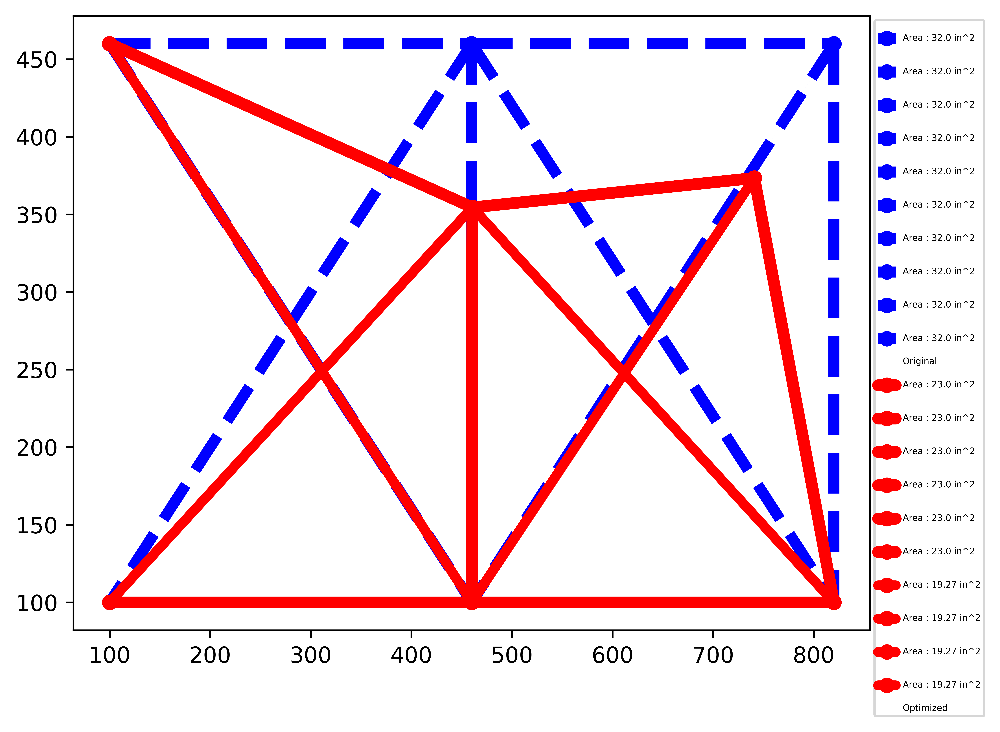

In [96]:
basic.Plot(original_nodes, 'b', '--', np.round(original_area,2), 'Original')
# scale = 10
# Dnodes=  soln[2]*scale + nodes
basic.Plot(zz[1], 'r', '-', np.round(zz[0],2), 'Optimized')

## No of bars

In [124]:
Truss.TrussAnalysis(area, nodes, bars)

(array([  3001.51934648,   1333.76242915,  -8242.95937184,  -4173.43520069,
          1049.0775804 ,   1095.91468832,   9891.26232933, -11987.44355181,
          1377.78735993,  -1725.12761134]),
 144970.97787804774,
 array([[ 0.        ,  0.        ],
        [ 0.1080547 , -0.97115063],
        [ 0.15607014, -1.58594329],
        [ 0.        ,  0.        ],
        [-0.29674654, -1.00891743],
        [-0.4469902 , -1.62539622]]),
 'Pass',
 array([[-300000.        ,   75445.78079808],
        [ 300000.        ,  124554.21920192]]))

In [128]:
bars.shape

(10, 2)

In [135]:
bars

array([[0, 1],
       [1, 2],
       [3, 4],
       [4, 5],
       [1, 4],
       [2, 5],
       [0, 4],
       [1, 3],
       [1, 5],
       [2, 4]])

In [139]:
def f_bar(area):
    return Truss.TrussAnalysis(area, nodes, bars)[1]

grad = nd.Gradient(f_bar)(area)
grad2 = nd.Gradient(grad)(area)
grad2

TypeError: 'numpy.ndarray' object is not callable

In [70]:

def cost(area, nodes, bars):
    ans = Truss.TrussAnalysis(x, nodes, bars)
    return ans
    

def lr(rate):
    item = []
    for idx in range(6):
        if (idx==1) or (idx==2):
            item.append([rate,rate])
        else:
            item.append([0,0])
    return np.array(item)

def optimize(area, nodes, bars):

    area_new = area
    nodes_new = nodes
    learning_rate = 0.001
    max_steps = 10000

    v = []
    for step in range(max_steps):
     
        if (cost(area, nodes, bars)[3]=="Pass") and (comp(area)==0):
            area_prev = area.copy()
            nodes_prev = nodes.copy()


            grad_area = nd.Gradient(f_area)(area)
            # Compute the gradient
            grad_nodes = nd.Gradient(f_shape)(nodes).reshape(-1,2)
            # grad1 = clip(grad1)
            # print(grad1)
            # Update x using gradient descent
           
            area_new -= grad_area*np.array([learning_rate]*10).astype(float)
            #nodes_new -= grad_nodes*lr(learning_rate).astype(float)
            # print(f"x_new : {x}")
            # Compute the current vol
            cost_value = cost(area_new, nodes_new, bars)[1]
        
            v.append(cost_value)

            area = area_new
            nodes = nodes_new
            # Print progress
            if step % 100 == 0:
                print("Step: {} Area: {} Nodes: {} Volume: {}\n".format(step, area_prev, nodes_prev, cost_value))
            else:
                pass

            # print("Step: {} Area: {} Nodes: {} Volume: {}\n".format(step, area_prev, nodes_prev, cost_value))
        else:
            print("Optimization Saturated")
            break
    return area_prev, nodes_prev, v


In [69]:
original_area, original_nodes, original_bars = np.array([32.]*10), nodes.copy(), bars.copy()
original_area, original_nodes, original_bars

(array([32., 32., 32., 32., 32., 32., 32., 32., 32., 32.]),
 array([[100., 460.],
        [460., 460.],
        [820., 460.],
        [100., 100.],
        [460., 100.],
        [820., 100.]]),
 array([[0, 1],
        [1, 2],
        [3, 4],
        [4, 5],
        [1, 4],
        [2, 5],
        [0, 4],
        [1, 3],
        [1, 5],
        [2, 4]]))

In [71]:
pp = optimize(original_area, original_nodes, original_bars)

Step: 0 Area: [32. 32. 32. 32. 32. 32. 32. 32. 32. 32.] Nodes: [[100. 460.]
 [460. 460.]
 [820. 460.]
 [100. 100.]
 [460. 100.]
 [820. 100.]] Volume: 83929.35059634515

Optimization Saturated


In [72]:
pp[0], pp[1]

(array([9.68      , 9.68      , 9.68      , 9.68      , 9.68      ,
        9.68      , 0.43475329, 0.43475329, 0.43475329, 0.43475329]),
 array([[100., 460.],
        [460., 460.],
        [820., 460.],
        [100., 100.],
        [460., 100.],
        [820., 100.]]))

In [73]:
Truss.TrussAnalysis(pp[0], pp[1], bars)

(array([  20621.71544686,    5086.09784909,  -20700.59860273,
          -5244.48066331,    5046.65627115,    5086.09784909,
         326532.99959836, -324049.11304072,  165139.12098608,
        -160151.93533307]),
 21794.160954151594,
 array([[  0.        ,   0.        ],
        [  0.74238176, -24.0739179 ],
        [  0.92548128, -37.45723969],
        [  0.        ,   0.        ],
        [ -0.74522155, -24.25559752],
        [ -0.93402285, -37.64033922]]),
 'Failed in 4 ways for stress \n Failed in 4 ways for deflection ',
 array([[-300000.        ,  100381.79447442],
        [ 300000.        ,   99618.20552558]]))

In [74]:
basic.Plot(original_nodes, 'b', '--', np.round(original_area,2), 'Original')
# scale = 10
# Dnodes=  soln[2]*scale + nodes
basic.Plot(pp[1], 'r', '-', np.round(pp[0],2), 'Optimized')

Error in callback <function _draw_all_if_interactive at 0x7fcd1ad2bf70> (for post_execute):


ValueError: All values in the dash list must be non-negative

ValueError: All values in the dash list must be non-negative

<Figure size 7680x5760 with 1 Axes>

In [ ]:
a = [11.5]*10 #area_gen(area_avalival)

In [ ]:
# a = [7.22,3.13,14.2,3.63,5.74,1.62,11.5,3.13,3.63,3.87]

In [ ]:
# a = [31.82, 1, 23.74, 15.32, 1, 1, 8.67, 22.09, 21.70, 1]

In [ ]:
a = np.array(a)

In [ ]:
a

In [ ]:
sum(a)

In [ ]:
# le = [360.   ,      360.    ,     360.       ,  360.   ,      360.,
#  360.  ,       509.11688245 ,509.11688245 ,509.11688245 ,509.11688245]

In [ ]:
# v = []
# for i, b in zip(a,le):
#     print(i,b)
#     v.append(i*b)

In [ ]:
# v

In [ ]:
# sum(v)

In [ ]:
# 57368/8083


In [ ]:
a_temp = Truss.TrussAnalysis(a, nodes, bars)

In [ ]:
a_temp

In [ ]:
print(f""" 
The Stress in the various members of the truss is \x1B[3mpsi\x1B[0m : \n{a_temp[0]}\n\n 
The Volume of the the truss is \x1B[3m inch^3 \x1B[0m : {a_temp[1]}\n
The nodal displacements [x & y] in \x1B[3minch\x1B[0m : \n{a_temp[2]}\n\n 
Results for check for stress and deflection limit : {a_temp[3]}\n
The reaction of the supports [x & y] in \x1B[3mpsi\x1B[0m : \n{a_temp[4]} """)

In [ ]:
basic.Plot(nodes, 'b', '--',a, 'Original')
scale = 10
Dnodes=  a_temp[2]*scale + nodes
basic.Plot(Dnodes, 'r', '-',a, 'Deformed')

In [ ]:
# defining the algorithm

def initialize(dim):
    '''Function that initilizes the bias and weights'''

    b = np.random.rand(dim)
    theta= np.random.rand(dim)
    return b,theta

b, theta = initialize(len(bars))
print(f"Bias : {b}, \nWeights : {theta}")

In [ ]:
def predict_Y(b, theta, area):

    pred = []
    if len(b) != len(theta):
        return print(f"The leangth of the weights and areas' are inconsistant")
    else:
        for i in range(len(area)):
            pred.append(b[i] + np.dot(area[i], theta[i]))
        return np.round(np.array(pred),2)

Y_hat = predict_Y(b,theta,a)
Y_hat

In [ ]:
Truss.TrussAnalysis(Y_hat, nodes, bars)

In [ ]:
def get_cost(Area, Nodes, Bar):
    ans = Truss.TrussAnalysis(Area, Nodes, Bar)
    
    loss = np.abs(ans[1]) #np.abs(ans[0]).sum()*0.0001 + np.abs(ans[1]) + np.abs(ans[2]).sum()
    # print(ans)
    #sum = ans.sum(axis=1)
    if ans[3]=='Pass':
        if loss == 0 :
            return 99999
        else:
            return abs(1/loss)
    else:
        return -1/loss #"Unstable solution"

get_cost(Y_hat, nodes, bars)

In [ ]:
def update_theta(area, y_hat, b_0, theta_o, learning_rate):
    db = (np.sum(area-y_hat)*2)/len(y_hat)
    dw = (np.dot((area-y_hat),area)*2)/len(y_hat)

    b_1 = b_0 - learning_rate*db
    theta_1 = theta_o - learning_rate*dw
    return b_1, theta_1
    
print("After initialization -Bias: ",b,"theta: ",theta)
Y_hat = predict_Y(b,theta,a)
b,theta = update_theta(a, Y_hat, b,theta, 0.01)
print("After first update -Bias: ",b,"theta: ",theta)
get_cost(Y_hat, nodes, bars)

In [ ]:
def run_gradient_descent(X, alpha, num_iterations):

    ''' X: area,
        alpha : learning rate
        num_iter : no of iterations
    '''

    b, theta = initialize(X.shape[0])
    iter_num=0
    gd_iterations_df = pd.DataFrame(columns=['iteration','cost'])
    result_idx=0

    for each_iter in range(num_iterations):
        # print(iter_num)
        Y_hat = predict_Y(b,theta,X)
        this_cost = get_cost(Y_hat, nodes, bars)
        prev_b = b
        prev_theta = theta
        b, theta = update_theta(a, Y_hat, b,theta,alpha)
        iter_num += 1
        if(iter_num%10==0):
            gd_iterations_df.loc[result_idx]=[iter_num,this_cost]
            result_idx=result_idx+1
            iter_num += 1

    print('Final Estimate of b and theta : ',b,theta)
    return gd_iterations_df,b,theta

gd_iterations_df,b,theta = run_gradient_descent(a, alpha=0.001,num_iterations=200)

In [ ]:
gd_iterations_df

In [ ]:
plt.plot(gd_iterations_df['iteration'], gd_iterations_df['cost'])
plt.xlabel('Number of iterations')
plt.ylabel('Cost or MSE')

In [ ]:
alpha_df_1, b, theta=run_gradient_descent(a,alpha=0.01,num_iterations=2000)
alpha_df_2, b, theta=run_gradient_descent(a,alpha=0.001,num_iterations=2000)

plt.plot(alpha_df_1['iteration'],alpha_df_1['cost'],label='1',alpha=0.01)
plt.plot(alpha_df_2['iteration'],alpha_df_2['cost'],label='2',alpha=0.001)

plt.legend()
plt.ylabel('cost')
plt.xlabel('Number of iterations')
plt.title('Cost Vs. Iterations for different alpha values')

In [ ]:
import numpy as np

def cost(x):
    return (2*x-5)**2

# def gradient(x):
#     return 4*(2*x-5)*2
def gradient(x):
    return nd.Gradient(cost)(x)

def optimize():
    x = np.random.rand() # initial x value
    learning_rate = 0.1
    max_steps = 20
    for step in range(max_steps):
        # Compute the gradient
        grad = gradient(x)
        
        # Update x using gradient descent
        x -= grad * learning_rate
        
        # Compute the current cost
        cost_value = cost(x)
        
        # Print progress
        # if step % 100 == 0:
        print("Step: {} x: {} Cost: {}".format(step, x, cost_value))

optimize()


In [ ]:
import numpy as np

def truss_volume(x):
    """Function that calculates the volume of a truss given its variables x"""
    # Assume the truss has the following dimensions:
    a, b, c, d = x[0], x[1], x[2], x[3]
    return a * b * c * d

def truss_volume_derivative(x, var):
    """Function that calculates the derivative of the truss volume with respect to the variable var"""
    h = 1e-8 # Step size
    var_index = var - 1 # Index of the variable in the x array
    x_plus_h = np.array(x)
    x_plus_h[var_index] += h
    x_minus_h = np.array(x)
    x_minus_h[var_index] -= h
    return (truss_volume(x_plus_h) - truss_volume(x_minus_h)) / (2 * h)

# Example usage:
x = [1, 2, 3, 4]
var = 2
derivative = truss_volume_derivative(x, var)
print(f"The derivative of the truss volume with respect to variable {var} is {derivative}")


In [ ]:
import numpy as np

class TrussOptimizer:
    def __init__(self, num_bars=10):
        self.num_bars = num_bars
        self.bar_lengths = np.zeros(num_bars)
        self.bar_areas = np.zeros(num_bars)
        self.bar_stiffness = np.zeros(num_bars)
        self.bar_forces = np.zeros(num_bars)
        self.bar_positions = np.zeros((num_bars, 4))
        self.bar_connectivity = np.zeros((num_bars, 2))
        self.cost_history = []
        self.learning_rate = 0.01
        self.max_steps = 1000

    def cost(self):
        """
        Compute the cost (e.g. weight) of the truss based on the current
        shape, size, and topology.
        """
        pass

    def gradient(self):
        """
        Compute the gradient of the cost function with respect to the
        shape, size, and topology parameters.
        """
        pass

    def optimize(self):
        """
        Optimize the shape, size, and topology of the truss using gradient
        descent.
        """
        for step in range(self.max_steps):
            # Compute the gradient
            grad = self.gradient()
            
            # Update the parameters using gradient descent
            self.bar_lengths -= grad[:self.num_bars] * self.learning_rate
            self.bar_areas -= grad[self.num_bars:2*self.num_bars] * self.learning_rate
            self.bar_stiffness -= grad[2*self.num_bars:3*self.num_bars] * self.learning_rate
            self.bar_forces -= grad[3*self.num_bars:4*self.num_bars] * self.learning_rate
            self.bar_positions -= grad[4*self.num_bars:4*self.num_bars+4*self.num_bars] * self.learning_rate
            self.bar_connectivity -= grad[4*self.num_bars+4*self.num_bars:] * self.learning_rate
            
            # Compute the current cost
            cost = self.cost()
            self.cost_history.append(cost)
            
            # Print progress
            if step % 100 == 0:
                print("Step: {} Cost: {}".format(step, cost))


optimizer = TrussOptimizer()
optimizer.optimize()


In [ ]:
import numpy as np

class Optimizer:
    def __init__(self):
        pass

    @staticmethod
    def run(o_problem, ra_parameters, i_steps, r_learning_rate):
        ra_cost = np.zeros(i_steps)
        for i_step in range(i_steps):
            ra_gradient = Optimizer.gradient(o_problem, ra_parameters)
            ra_parameters = ra_parameters - ra_gradient * r_learning_rate
            ra_cost[i_step] = Optimizer.cost(o_problem, ra_parameters)
            if i_step % 100 == 1:
                Optimizer.sketch_truss(o_problem)
            if i_step > 100:
                if ra_cost[i_step] / ra_cost[i_step - 100] > 0.9995:
                    break
        return ra_parameters, ra_cost

    @staticmethod
    def gradient(o_problem, ra_parameters):
        r_epsilon = max(np.abs(ra_parameters)) / 1e6
        r_cost_0 = Optimizer.cost(o_problem, ra_parameters)
        ra_gradient = np.zeros(len(ra_parameters))
        for i_parameter in range(len(ra_parameters)):
            ra_parameters_1 = ra_parameters
            ra_parameters_1[i_parameter] = ra_parameters_1[i_parameter] + r_epsilon
            r_cost_1 = Optimizer.cost(o_problem, ra_parameters_1)
            ra_gradient[i_parameter] = (r_cost_1 - r_cost_0) / r_epsilon
        return ra_gradient

    @staticmethod
    def cost(o_problem, ra_parameters):
        # function to calculate cost
        pass

    @staticmethod
    def sketch_truss(o_problem):
        # function to sketch truss
        pass


# New Start

In [ ]:
import sympy as sym
from sympy import Matrix
#from sympy.abc import x1, x2, x3, x4, x5, x6
from sympy import symbols
from sympy import solve
from sympy import diff

# Define the matrix of global stiffness
def global_stiffness_matrix(nodes, elements, E, A):
    # Create empty matrix with size 2*nodes x 2*nodes
    K = Matrix.zeros(2*len(nodes), 2*len(nodes))
    # Loop through each element
    for element in elements:
        # Define the element stiffness matrix
        k = E * A * Matrix([[1, -1], [-1, 1]])
        # Define the element displacement matrix
        u = Matrix([x[element[0]], y[element[0]], x[element[1]], y[element[1]]])
        # Define the element rotation matrix
        R = Matrix([[-1, 0, 1, 0], [0, -1, 0, 1]])
        # Add the element stiffness matrix to the global stiffness matrix
        K[2*element[0]:2*element[0]+2, 2*element[0]:2*element[0]+2] += R.T * k * R
    return K

# Define the load vector
def load_vector(nodes, loads):
    # Create empty vector with size 2*nodes x 1
    F = Matrix.zeros(2*len(nodes), 1)
    # Loop through each load
    for load in loads:
        F[2*load[0]] = load[1]
        F[2*load[0]+1] = load[2]
    return F

# Define the displacement matrix
def displacement_matrix(nodes, supports):
    # Create empty matrix with size 2*nodes x 1
    U = Matrix.zeros(2*len(nodes), 1)
    # Loop through each support
    for support in supports:
        U[2*support[0]] = support[1]
        U[2*support[0]+1] = support[2]
    return U

# Define the boundary condition matrix
def boundary_condition_matrix(nodes, supports):
    # Create empty matrix with size 2*nodes x 2*nodes
    B = Matrix.zeros(2*len(nodes), 2*len(nodes))
    # Loop through each support
    for support in supports:
        B[2*support[0], 2*support[0]] = 1
        B[2*support[0]+1, 2*support[0]+1] = 1
    return B

# Truss analysis
def truss_analysis(nodes, elements, E, A, loads, supports):
    K = global_stiffness_matrix(nodes, elements, E, A)
    F = load_vector(nodes, loads)
    B = boundary_condition_matrix(nodes, supports)
    U_bc = displacement_matrix(nodes, supports)
    U = B * U_bc + (B.inv() * (F - K * U_bc))
    return U

# Define the function to optimize
from scipy.optimize import minimize

# Define the function to optimize
def optimize_area(area, nodes, elements, E, loads, supports):
    U = truss_analysis(nodes, elements, E, area, loads, supports)
    stress = []
    for element in elements:
        u = Matrix([U[2*element[0]], U[2*element[0]+1], U[2*element[1]], U[2*element[1]+1]])
        R = Matrix([[-1, 0, 1, 0], [0, -1, 0, 1]])
        stress.append(E*(R*u)[0])
    return max(stress)

# Define the initial area
A = symbols("A")

# Define the optimization constraints
constraints = [A>0]

# Define the optimization bounds
bounds = [(0, None)]

# Minimize the area using the method of gradient descent
result = minimize(optimize_area, 1, args=(nodes, bars, E, P, DOFCON), constraints=constraints, bounds=bounds, method='SLSQP')

# Print the optimized area
print("Optimized area: ", result.x)
